In [20]:
gap_time = 1
#gap_time = 10  # gap time between each segment
win_size = [10, 30, 60]  # window size of each segment
step_max = 5 # maximum step of ConvLSTM


#raw_data_path = "output_file.csv"
raw_data_path = "train_test_norm_data.csv"  # path to load raw data
#model_path = '../MSCRED/'
train_data_path = ""
test_data_path = ""
reconstructed_data_path = ""


train_start_id = 10
train_end_id = 1300

valid_start_id = 1300
valid_end_id = 1500

test_start_id = 1300
test_end_id = 2029


training_iters = 5
save_model_step = 1

learning_rate = 0.0002

threshold_default = 0.05
alpha = 1.5

In [9]:
df = pd.read_csv(raw_data_path, index_col = 0)
df

,0,1,2,3,4,5,6,7,8,9,...,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [21]:
import numpy as np
import pandas as pd
import seaborn as sns

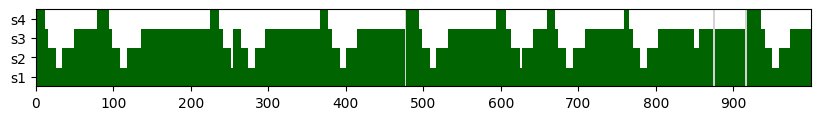

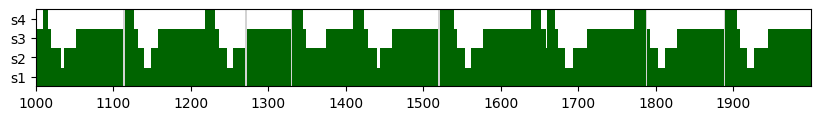

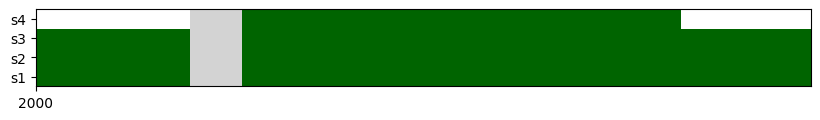

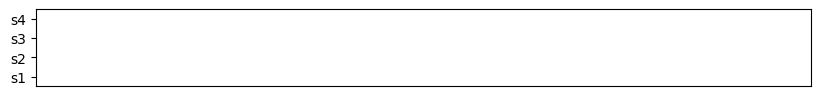

In [22]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

df = pd.read_csv(raw_data_path, index_col = 0)
data = np.flip(df.to_numpy(), 0)
start = 0
end = 200

def plot_data(data, min, max):
    fig, axs = plt.subplots()
    fig.set_figwidth(10)
    fig.set_figheight(1)
    axs.set_yticks([0.5, 1.5, 2.5, 3.5], ["s1", "s2", "s3", "s4"])
    axs.set_xticks(range(0,max-min,100), range(min,max,100))
    axs.pcolor(data[:,min:max], cmap = ListedColormap(["lightgray", "white", "darkgreen"]))

plot_data(data,0,1000)
plot_data(data,1000,2000)
plot_data(data,2000,3000)
plot_data(data,3000,data.shape[1])

In [25]:
class SignatureMatrices:
    def __init__(self):

        
        self.raw_data = pd.read_csv(raw_data_path, index_col = 0)
        self.series_number = self.raw_data.shape[0]
        self.series_length = self.raw_data.shape[1]
        self.signature_matrices_number = int(self.series_length / gap_time)

        print("series_number is", self.series_number)
        print("series_length is", self.series_length)
        print("signature_matrices_number is", self.signature_matrices_number)

    def signature_matrices_generation(self, win):
        """
        Generation signature matrices according win_size and gap_time, the size of raw_data is n * T, n is the number of
        time series, T is the length of time series.
        To represent the inter-correlations between different pairs of time series in a multivariate time series segment
        from t − w to t, we construct an n × n signature matrix Mt based upon the pairwise inner-product of two time series
        within this segment.
        :param win: the length of the time series segment
        :return: the signature matrices
        """

        if win == 0:
            print("The size of win cannot be 0")

        raw_data = np.asarray(self.raw_data)
        signature_matrices = np.zeros((self.signature_matrices_number, self.series_number, self.series_number))

        for t in range(win, self.signature_matrices_number):
            raw_data_t = raw_data[:, t - win:t]
            signature_matrices[t] = np.dot(raw_data_t, raw_data_t.T) / win
            
        return signature_matrices

    def generate_train_test(self, signature_matrices):
        """
        Generate train and test dataset, and store them to ../data/train/train.npy and ../data/test/test.npy
        :param signature_matrices:
        :return:
        """
        train_dataset = []
        valid_dataset = []
        test_dataset = []

        for data_id in range(self.signature_matrices_number):
            index = data_id - step_max + 1
            if data_id < train_start_id:
                continue
            index_dataset = signature_matrices[:, index:index + step_max]
            index_dataset = np.moveaxis(index_dataset, [0, 1], [3, 0])
            if data_id < train_end_id:
                train_dataset.append(index_dataset)
            if data_id >= valid_start_id and data_id < valid_end_id:
                valid_dataset.append(index_dataset)
                test_dataset.append(index_dataset)
            elif data_id >= valid_end_id:
                test_dataset.append(index_dataset)

        train_dataset = np.asarray(train_dataset)
        #train_dataset = np.reshape(train_dataset, [-1, step_max, self.series_number, self.series_number,
                                                  # signature_matrices.shape[0]])
        valid_dataset = np.asarray(valid_dataset)
       # valid_dataset = np.reshape(valid_dataset, [-1, step_max,self.series_number, self.series_number,
                                               # signature_matrices.shape[0]])
        test_dataset = np.asarray(test_dataset)
       # test_dataset = np.reshape(test_dataset, [-1, step_max,self.series_number, self.series_number,
                                              #  signature_matrices.shape[0]])

        


        print("train dataset shape is", train_dataset.shape)
        print("valid dataset shape is", valid_dataset.shape)
        print("test dataset shape is", test_dataset.shape)
        global_min = np.min([np.min(matrix) for matrix in test_dataset])
        global_max = np.max([np.max(matrix) for matrix in test_dataset])
        print('global_min and global_max', global_min, global_max)
        train_path = ""
        
        train_path = "train.npy"

        valid_path = ""
        
        valid_path = "valid.npy"
        test_path = "test.npy"

        np.save(train_path, train_dataset)
        np.save(valid_path, valid_dataset)
        np.save(test_path, test_dataset)
        print(train_dataset[-1].shape)
        #new_df = np.concatenate(train_dataset[890], axis = 2)
       # train_data_sample = np.transpose(new_df, (2, 0, 1))

        #print(train_data_sample)
        #train_data_sample = np.random.rand(15, 4, 4)

       
        

        #train_data_sample = np.random.rand(15, 4, 4)

        #global_min = np.min(train_dataset)
        #global_max = np.max(train_dataset)

        #fig, ax = plt.subplots(15, 1, figsize=(3, 30))

        #for i in range(15):
           # sns.heatmap(train_data_sample[i], ax=ax[i], cmap='YlGnBu', vmin=global_min, vmax=global_max)  # Строим heatmap с учетом глобальных минимума и максимума
#ax[i].set_title(f'Slice {i+1}')  # Устанавливаем заголовок для подграфика

#plt.tight_layout()
#plt.show()




In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
Matrices = SignatureMatrices()
signature_matrices = []

    # Generation signature matrices according the win size w
for w in win_size:
    signature_matrices.append(Matrices.signature_matrices_generation(w))

signature_matrices = np.asarray(signature_matrices)
print("the shape of signature_matrices is", signature_matrices.shape)

    # Generate train and test dataset
Matrices.generate_train_test(signature_matrices)


series_number is 4
series_length is 2030
signature_matrices_number is 2030
the shape of signature_matrices is (3, 2030, 4, 4)
train dataset shape is (1290, 5, 4, 4, 3)
valid dataset shape is (200, 5, 4, 4, 3)
test dataset shape is (730, 5, 4, 4, 3)
global_min and global_max 0.0 1.0
(5, 4, 4, 3)


<AxesSubplot:>

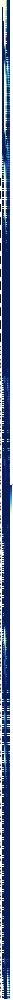

In [46]:
#fig, axes = plt.subplots(168, 12, figsize=(10, 150))
fig, axes = plt.subplots(1, 1, figsize=(4, 400))

global_min = np.min([np.min(matrix) for matrix in signature_matrices])
global_max = np.max([np.max(matrix) for matrix in signature_matrices])
new_big_matrix = np.zeros((3, 3, 5760, 4))
for i in range(3):
    for j in range(3):
        idx1 = i * 1440
        idx2 = (i + 1) * 1440
        new_big_matrix[i][j] = np.concatenate(signature_matrices[j][idx1:idx2], axis = 0)
result = np.concatenate(np.concatenate(new_big_matrix, axis = 0), axis = 1)
sns.heatmap(result, cmap="YlGnBu", vmin=global_min, vmax=global_max, annot=False) 


In [27]:
#import utils as util
import numpy as np
import os
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [28]:
def cnn_encoder_layer(data, filter_layer, strides):
    result = tf.nn.conv2d(
        input=data,
        filters=filter_layer,
        strides=strides,
        padding="SAME")
    return tf.nn.selu(result)


def tensor_variable(shape, name):
    with tf.compat.v1.variable_scope(tf.compat.v1.get_variable_scope(), reuse=tf.compat.v1.AUTO_REUSE):
        variable = tf.compat.v1.get_variable(name, shape=shape, initializer=tf.compat.v1.keras.initializers.glorot_uniform())
    return variable


def cnn_encoder(data):
    filter1 = tensor_variable([2, 2, 3, 8], "filter1")
    strides1 = (1, 1, 1, 1)
    cnn1_out = cnn_encoder_layer(data, filter1, strides1) # Output is Bx2x2x8
    
    
    filter2 = tensor_variable([2, 2, 8, 16], "filter2") # Output is Bx2x2x16
    strides2 = (1, 2, 2, 1)
    cnn2_out = cnn_encoder_layer(cnn1_out, filter2, strides2)
    
    return cnn1_out, cnn2_out


def cnn_lstm_attention_layer(input_data, layer_number):
    #outputs = tf.compat.v1.placeholder(tf.float32, [5, 30, 30, 32])
    convlstm_layer = tf.compat.v1.keras.layers.ConvLSTM2D( 
        filters=input_data.shape[-1],
        padding='same',
        kernel_size=(2, 2),
        use_bias=True,
        return_sequences=True,
        name="conv_lstm_cell" + str(layer_number))
    #print('!', convlstm_layer )
    outputs = convlstm_layer(input_data)
    attention_w = []
    for k in range(step_max):
        attention_w.append(tf.reduce_sum(tf.multiply(outputs[:, k], outputs[:, -1])) / step_max)
    attention_w = tf.reshape(tf.nn.softmax(tf.stack(attention_w)), [1, step_max])
    
    outputs = tf.reshape(outputs, [step_max, -1])
    
    # а вот это как раз та матрица, которая почему-то меньше нужного
    outputs = tf.matmul(attention_w, outputs)
    #ошибка в строке ниже
    
    outputs = tf.reshape(outputs, [1, input_data.shape[2], input_data.shape[3], input_data.shape[4]])

    return outputs, attention_w


def cnn_decoder_layer(conv_lstm_out_c, filter, output_shape, strides):
    deconv = tf.nn.conv2d_transpose(
        value=conv_lstm_out_c,
        filters=filter,
        output_shape=output_shape,
        strides=strides,
        padding="SAME")
    deconv = tf.nn.selu(deconv)
    return deconv


def cnn_decoder(lstm1_out, lstm2_out):
      
    d_filter2 = tensor_variable([2, 2, 8, 16], "d_filter2")
    dec2 = cnn_decoder_layer(lstm2_out, d_filter2, [1, 4, 4, 8], (1, 2, 2, 1))
    print("dec2:", dec2.shape)
    dec2_concat = tf.concat([dec2, lstm1_out], axis=3) # 1x4x4x16
    print("dec2_concat:", dec2_concat.shape)
    
    d_filter1 = tensor_variable([2, 2, 3, 16], "d_filter1")
    dec1 = cnn_decoder_layer(dec2_concat, d_filter1, [1, 4, 4, 3], (1, 1, 1, 1))
    print("dec1:", dec1.shape)
    return dec1


conv1_lstm_out: (1, 4, 4, 8)
conv2_lstm_out: (1, 2, 2, 16)
dec2: (1, 4, 4, 8)
dec2_concat: (1, 4, 4, 16)
dec1: (1, 4, 4, 3)


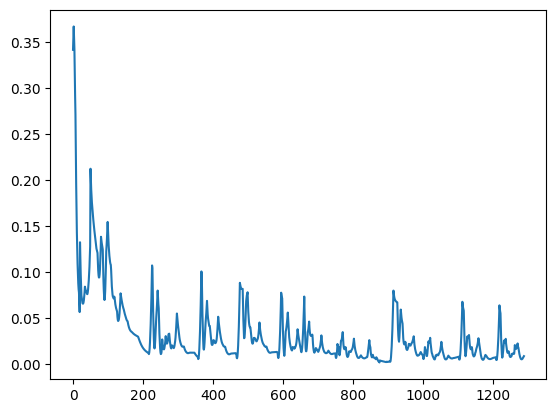

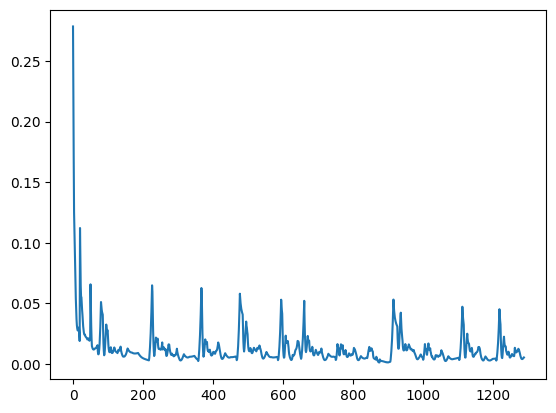

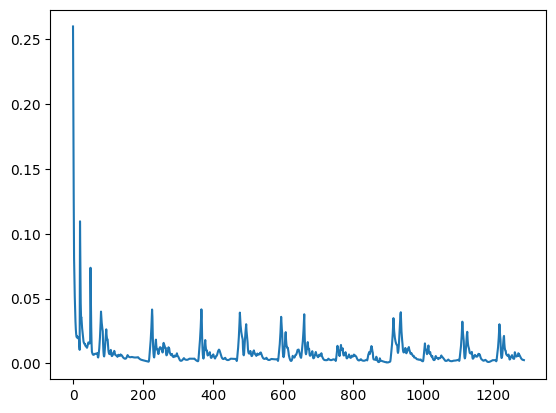

In [29]:
matrix_data_path = train_data_path + "train.npy"
matrix_gt_1 = np.load(matrix_data_path)

data_input = tf.compat.v1.placeholder(tf.float32, [5, 4, 4, 3])

conv1_out, conv2_out = cnn_encoder(data_input)

conv1_out = tf.reshape(conv1_out, [ 1, 5, 4, 4, 8])
    
conv2_out = tf.reshape(conv2_out, [ 1, 5, 2, 2, 16])


conv1_lstm_attention_out, atten_weight_1 = cnn_lstm_attention_layer(conv1_out, 1)
print("conv1_lstm_out:", conv1_lstm_attention_out.shape)

conv2_lstm_attention_out, atten_weight_2 = cnn_lstm_attention_layer(conv2_out, 2)
print("conv2_lstm_out:", conv2_lstm_attention_out.shape)

deconv_out = cnn_decoder(conv1_lstm_attention_out, conv2_lstm_attention_out)

loss = tf.reduce_mean(tf.square(data_input[-1] - deconv_out))

optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=learning_rate).minimize(loss)
    
init = tf.global_variables_initializer()
sess = tf.compat.v1.Session()
sess.run(init)


for i in range(0,3):
    loss_value_list = []
    for idx in range(train_start_id, train_end_id):
        matrix_gt = matrix_gt_1[idx - train_start_id]
        feed_dict = {data_input: np.asarray(matrix_gt)}
        a, loss_value = sess.run([optimizer, loss], feed_dict)
        #print("mse of last train data: " + str(loss_value))
        loss_value_list.append(loss_value)
    plt.plot(loss_value_list)   
    plt.show()


In [30]:
def plot_model_results(batch, title):
    fig, axs = plt.subplots(3, 3, sharex = True, sharey = True)

    input = batch[-1]

    feed_dict = {data_input: batch}
    result, _ = sess.run([deconv_out, loss], feed_dict)
    result = np.asarray(result[0])
    
    diff = result - input

    vmin = min(np.min(input), np.min(result), np.min(diff))
    vmax = max(np.max(input), np.max(result), np.max(diff))

    axs[0,0].set_title("true")
    axs[0,1].set_title("predicted")
    axs[0,2].set_title("difference")

    for window in range(0, 3):
        axs[window, 0].pcolor(input[:, :, window], vmin = vmin, vmax = vmax)
    for window in range(0, 3):
        axs[window, 1].pcolor(result[:, :, window], vmin = vmin, vmax = vmax)
    for window in range(0, 3):
        colormap = axs[window, 2].pcolor(diff[:, :, window], vmin = vmin, vmax = vmax)

    fig.suptitle(title)
    fig.subplots_adjust(right=0.8)
    cb_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(colormap, cax = cb_ax)

matrix_data_path = "valid.npy"
matrix_data = np.load(matrix_data_path)

plot_model_results(matrix_data[250], "valid[250]")

IndexError: index 250 is out of bounds for axis 0 with size 200

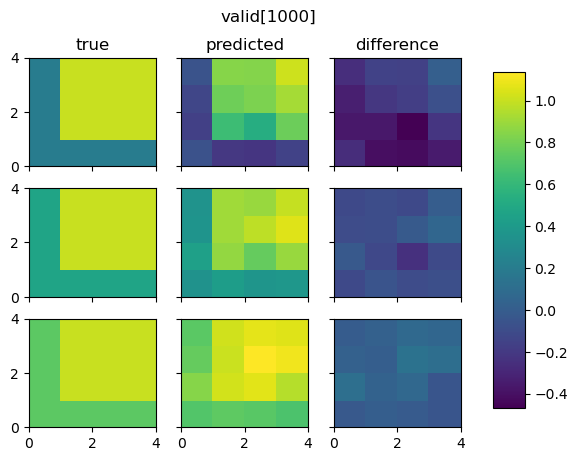

In [48]:
plot_model_results(matrix_data[1000], "valid[1000]")

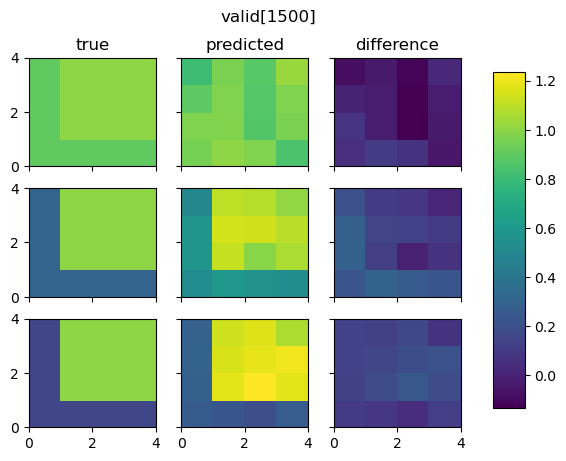

In [49]:
plot_model_results(matrix_data[1500], "valid[1500]")

matrix_data: (200, 5, 4, 4, 3)


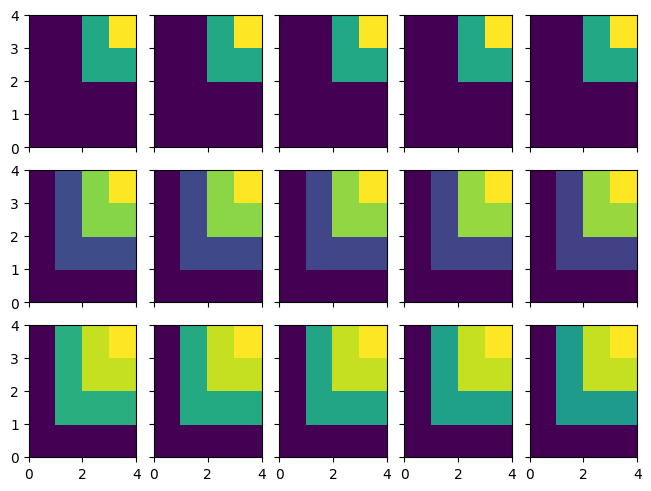

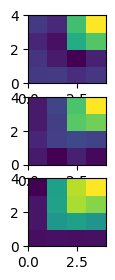

In [32]:
matrix_data_path = "valid.npy"
matrix_data = np.load(matrix_data_path)
print("matrix_data:", matrix_data.shape)

time = 150
fig, axs = plt.subplots(3, 5, sharex = True, sharey = True, layout = "constrained")
for window in range(0, 3):
    for step in range(0, 5):
        axs[window, step].pcolor(matrix_data[time, step, :, :, window])

feed_dict = {data_input: np.asarray(matrix_data[time])}
result, loss_value = sess.run([deconv_out, loss], feed_dict)
fig, axs = plt.subplots(3, 1, figsize=(1, 3))
for window in range(0, 3):
    axs[window].pcolor(result[0, :, :, window])

In [33]:
matrix_data_path = "valid.npy"
matrix_gt_1 = np.load(matrix_data_path)
result_all = []

for idx in range(valid_start_id, valid_end_id):
    matrix_gt = matrix_gt_1[idx - valid_start_id]
    if idx == valid_start_id + 2000:
        print("matrix_gt_1[idx - valid_start_id]", matrix_gt_1[idx - valid_start_id].shape)
        time = idx
        #test_data_path = "test.npy"
        #test_data = np.load(test_data_path)
        fig, axs = plt.subplots(3, 5, sharex = True, sharey = True, layout = "constrained")
        for window in range(0, 3):
            for step in range(0, 5):
                axs[window, step].pcolor(matrix_gt_1[time, step, :, :, window])
    feed_dict = {data_input: np.asarray(matrix_gt)}
    result, loss_value = sess.run([deconv_out, loss], feed_dict)
    if idx == valid_start_id + 2000:
        print("result", result.shape)
        fig, axs = plt.subplots(3, 1, figsize=(1, 3))
        for window in range(0, 3):
            axs[window].pcolor(result[0, :, :, window])
    result_all.append(result)
    #print("mse of last valid data: " + str(loss_value))  
reconstructed_path = reconstructed_data_path

reconstructed_path = "valid_reconstructed.npy"

result_all = np.asarray(result_all).reshape((-1, 4, 4, 3))
np.save(reconstructed_path, result_all)

test_data_path = "test.npy"
matrix_test = np.load(test_data_path)
result_all_test = []

for idx in range(test_start_id, test_end_id):
    matrix_gt = matrix_test[idx - test_start_id]
    feed_dict = {data_input: np.asarray(matrix_gt)}
    result, loss_value = sess.run([deconv_out, loss], feed_dict)
    result_all_test.append(result)
    #print("mse of last test data: " + str(loss_value))
reconstructed_test_path = "test_reconstructed.npy"
result_all_test = np.asarray(result_all_test).reshape((-1, 4, 4, 3))
np.save(reconstructed_test_path, result_all_test)
print(result_all_test.shape)

(729, 4, 4, 3)


In [ ]:
matrix_gt_1[idx - valid_start_id] (5, 4, 4, 3)data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAosAAAHrCAYAAACn9tfQAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjUuMywgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/NK7nSAAAACXBIWXMAAA9hAAAPYQGoP6dpAAAl0ElEQVR4nO3df4yVdZ4n+k9RyMFW6ii4tCJVauJEr3KBCMKyThQVNYyhZf+ae+NdCX84kZRGlmS0mZ2dyuRqik0nXuyBIOnVYbM3KNd7U5rYUUKYAPHaIJQhS2vGtK4z1rRCzaxyCqr1NFLP/tGxGoSvXc+pOnXq1PN6Jc8fz5PnOd/P4V0e33V+1GnJsiwLAAC4iCmNHgAAgIlLWQQAIElZBAAgSVkEACBJWQQAIElZBAAgSVkEACBJWQQAIElZBAAgSVkEACBpVGVx06ZN0dLSEuvXrx+jcQAAmEhqLouHDx+O7du3x/z588dyHgAAJpCayuLp06fj4Ycfjp/97Gdx5ZVXjvVMAABMEFNruaizszMefPDBWLFiRTzzzDPfe261Wo1qtTq8PzQ0FF988UXMmjUrWlpaalmecZJlWZw6dSrmzJkTU6aM/PcKmTe3WnKXeXOTefF4fC+eWjP/9uJcXn755WzevHnZV199lWVZlt11113Zk08+mTy/q6sriwhbE299fX25fkZkPjm2PLnLfHJsMi/e5vG9eFvezLMsy1qyLMtihPr6+mLx4sWxZ8+e4fcqLl++PBYuXBibN2++6DXf/S2kUqlER0dH/HH8SUyNS0a6dE3+6b/eUtfbP9fhpbvGba3xMnB6KK677R/i5MmTUS6XR3xdIzP/eOttdb39c/23+/7LuK01nmrJvZGZR0R88p9ur/saERFH/+1L47LOeGvGzD//90vrvsa3Dq77z+O21nhpxsf3gf99SV1v/1x7//rFcVtrvNSaeUTOl6F7e3ujv78/brvt9/9DPnv2bBw4cCC2bNkS1Wo1Wltbz7umVCpFqVS6yMKXxNSW+v5gtf5gel1v/1xtM1r/8ElNKu9LC43MfMqlMh8reXJvZOYREVOmj0/uMv+9RmfeWvLf+lhopsf31mkyHwu1vF0gV1m8995749ixY+cdW7t2bdx8883x9NNPX1AUAQBobrnK4owZM2LevHnnHbvsssti1qxZFxwHAKD5+QYXAACSavrTOefat2/fGIwBAMBE5JlFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACScpXFbdu2xfz586OtrS3a2tpi2bJl8eabb9ZrNgAAGixXWZw7d25s2rQpent748iRI3HPPffEQw89FO+//3695gMAoIGm5jl51apV5+0/++yzsW3btjh48GDceuutYzoYAACNl6ssnuvs2bPx6quvxuDgYCxbtix5XrVajWq1Orw/MDBQ65I0CZkXj8yLR+bFJPdiyv0Bl2PHjsXll18epVIpHnvssejp6YlbbrkleX53d3eUy+Xhrb29fVQDM/HJvHhkXjwyLya5F1PusnjTTTfF0aNH49ChQ7Fu3bpYs2ZNfPDBB8nzN27cGJVKZXjr6+sb1cBMfDIvHpkXj8yLSe7FlPtl6GnTpsWNN94YERGLFi2Kw4cPx/PPPx/bt2+/6PmlUilKpdLopqSpyLx4ZF48Mi8muRfTqP/O4tDQ0HnvXwAAYPLI9czixo0bY+XKldHR0RGnTp2KnTt3xr59+2L37t31mg8AgAbKVRb7+/vjkUceic8//zzK5XLMnz8/du/eHffdd1+95gMAoIFylcUXX3yxXnMAADAB+W5oAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACSlEUAAJKURQAAkpRFAACScpXF7u7uuP3222PGjBkxe/bsWL16dXz44Yf1mg0AgAbLVRb3798fnZ2dcfDgwdizZ0+cOXMm7r///hgcHKzXfAAANNDUPCe/9dZb5+3v2LEjZs+eHb29vXHnnXeO6WAAADRerrL4XZVKJSIiZs6cmTynWq1GtVod3h8YGBjNkjQBmRePzItH5sUk92Kq+QMuQ0NDsX79+rjjjjti3rx5yfO6u7ujXC4Pb+3t7bUuSZOQefHIvHhkXkxyL6aWLMuyWi5ct25dvPnmm/H222/H3Llzk+dd7LeQ9vb2WB4PxdSWS2pZesT6/t//ta63P9md/c3X8dG/645KpRJtbW0jvq6Rmf/qxdvrevtFMPTV19HX2ZUr90ZmHhHx8eZ/Xfc1JrOhr7+Of3z6L5sq88+e/jd1X2MyO1v9Oj78v/6iqR7fK48sq+vtT3Znf/t1vPfyf8ideUSNL0M//vjj8cYbb8SBAwe+tyhGRJRKpSiVSrUsQ5OSefHIvHhkXkxyL6ZcZTHLsnjiiSeip6cn9u3bFzfccEO95gIAYALIVRY7Oztj586d8frrr8eMGTPi+PHjERFRLpfj0ksvrcuAAAA0Tq4PuGzbti0qlUosX748rrnmmuFt165d9ZoPAIAGyv0yNAAAxeG7oQEASFIWAQBIUhYBAEhSFgEASFIWAQBIUhYBAEhSFgEASFIWAQBIUhYBAEhSFgEASFIWAQBIUhYBAEhSFgEASFIWAQBIUhYBAEhSFgEASFIWAQBIUhYBAEhSFgEASFIWAQBIUhYBAEhSFgEASMpdFg8cOBCrVq2KOXPmREtLS7z22mt1GAsAgIkgd1kcHByMBQsWxNatW+sxDwAAE8jUvBesXLkyVq5cWY9ZAACYYHKXxbyq1WpUq9Xh/YGBgXovSYPJvHhkXjwyLya5F1PdP+DS3d0d5XJ5eGtvb6/3kjSYzItH5sUj82KSezG1ZFmW1XxxS0v09PTE6tWrk+dc7LeQ9vb2WB4PxdSWS2pdmnHwTXYm9sXrUalUoq2tbcTXyby51ZK7zJubzIvH43vx1Jp5xDi8DF0qlaJUKtV7GSYQmRePzItH5sUk92LydxYBAEjK/czi6dOn46OPPhre/+STT+Lo0aMxc+bM6OjoGNPhAABorNxl8ciRI3H33XcP72/YsCEiItasWRM7duwYs8EAAGi83GVx+fLlMYrPxAAA0ES8ZxEAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCApJrK4tatW+P666+P6dOnx9KlS+Pdd98d67kAAJgAcpfFXbt2xYYNG6Krqyvee++9WLBgQTzwwAPR399fj/kAAGigqXkveO655+LRRx+NtWvXRkTECy+8ED//+c/jpZdeih//+McXnF+tVqNarQ7vVyqViIj4Js5EZLWOzXj4Js5ERESW5QtK5s2tltxl3txkXjwe34un1sy/vWjEqtVq1tramvX09Jx3/JFHHsl+9KMfXfSarq6uLH73I2Rr0u3jjz/O82Mi80my5cld5pNjk3nxNo/vxdvyZp5lWdaSZSOvmJ999llce+218c4778SyZcuGjz/11FOxf//+OHTo0AXXfPe3kJMnT8Z1110Xn376aZTL5ZEuPaENDAxEe3t79PX1RVtbW6PHGTOVSiU6Ojriyy+/jCuuuGLE1xUh8wi5n0vmzU3maTI/XxFyl/mFcr8MnVepVIpSqXTB8XK5PKlCiIhoa2ubdPcpImLKlHxvbS1S5hFyj5D5ZCHzNJn/TpFyl/k51+Q5+aqrrorW1tY4ceLEecdPnDgRV199de7FAQCY2HKVxWnTpsWiRYti7969w8eGhoZi7969570sDQDA5JD7ZegNGzbEmjVrYvHixbFkyZLYvHlzDA4ODn86+g8plUrR1dV10aexm9VkvE8RY3e//Ps0l7G4X/5tmovM09yv8bmdiWQy3qeI0d2vXB9w+daWLVviJz/5SRw/fjwWLlwYP/3pT2Pp0qW5FwcAYGKrqSwCAFAMvhsaAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgCRlEQCAJGURAIAkZREAgKRRlcVNmzZFS0tLrF+/fozGAQBgIqm5LB4+fDi2b98e8+fPH8t5AACYQGoqi6dPn46HH344fvazn8WVV1451jMBADBBTK3los7OznjwwQdjxYoV8cwzz3zvudVqNarV6vD+0NBQfPHFFzFr1qxoaWmpZXnGSZZlcerUqZgzZ05MmTLy3ytk3txqyV3mzU3mxePxvXhqzfzbi3N5+eWXs3nz5mVfffVVlmVZdtddd2VPPvlk8vyurq4sImxNvPX19eX6GZH55Njy5C7zybHJvHibx/fibXkzz7Isa8myLIsR6uvri8WLF8eePXuG36u4fPnyWLhwYWzevPmi13z3t5BKpRIdHR3xx/EnMTUuGenSNfn1//2/1PX2z/Xukv9n3NYaLwOnh+K62/4hTp48GeVyecTXNTLzj7feVtfbP9d/u++/jNta46mW3BuZeUTEJ//p9rqvERFx9N++NC7rjLdmzPzT/7i07mt8q/ff/edxW2u8NOPj+6//fPwyf/dRmZ8r18vQvb290d/fH7fd9vv/IZ89ezYOHDgQW7ZsiWq1Gq2treddUyqVolQqXWThS2JqS31/sFp/ML2ut3+uthmtf/ikJpX3pYVGZj7lUpmPlTy5NzLziIgp08cnd5n/XqMzbx2nzCMmd+7N9PjeWpL5WKjl7QK5yuK9994bx44dO+/Y2rVr4+abb46nn376gqIIAEBzy1UWZ8yYEfPmzTvv2GWXXRazZs264DgAAM3PN7gAAJBU05/OOde+ffvGYAwAACYizywCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCUqyxu27Yt5s+fH21tbdHW1hbLli2LN998s16zAQDQYLnK4ty5c2PTpk3R29sbR44ciXvuuSceeuiheP/99+s1HwAADTQ1z8mrVq06b//ZZ5+Nbdu2xcGDB+PWW28d08EAAGi8XGXxXGfPno1XX301BgcHY9myZcnzqtVqVKvV4f2BgYFal6RJyLx4ZF48Mi8muRdT7g+4HDt2LC6//PIolUrx2GOPRU9PT9xyyy3J87u7u6NcLg9v7e3toxqYiU/mxSPz4pF5Mcm9mHKXxZtuuimOHj0ahw4dinXr1sWaNWvigw8+SJ6/cePGqFQqw1tfX9+oBmbik3nxyLx4ZF5Mci+m3C9DT5s2LW688caIiFi0aFEcPnw4nn/++di+fftFzy+VSlEqlUY3JU1F5sUj8+KReTHJvZhG/XcWh4aGznv/AgAAk0euZxY3btwYK1eujI6Ojjh16lTs3Lkz9u3bF7t3767XfAAANFCustjf3x+PPPJIfP7551Eul2P+/Pmxe/fuuO++++o1HwAADZSrLL744ov1mgMAgAnId0MDAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCUqyx2d3fH7bffHjNmzIjZs2fH6tWr48MPP6zXbAAANFiusrh///7o7OyMgwcPxp49e+LMmTNx//33x+DgYL3mAwCggabmOfmtt946b3/Hjh0xe/bs6O3tjTvvvHNMBwMAoPFylcXvqlQqERExc+bM5DnVajWq1erw/sDAwGiWpAnIvHhkXjwyLya5F1PNH3AZGhqK9evXxx133BHz5s1Lntfd3R3lcnl4a29vr3VJmoTMi0fmxSPzYpJ7MbVkWZbVcuG6devizTffjLfffjvmzp2bPO9iv4W0t7fH8ngoprZcUsvSI/ZP/1+6xPKHnf3N1/Gr/2NTVCqVaGtrG/F1jcz8Vy/eXtfbL4Khr76Ovs6uXLk3MvOIiI83/+u6rzGZDX39dfzj03/ZVJn/4zP/pu5rTGZnv/46/vv/+RdN9fj+T/9B5qNxtvp1/Oon+TOPqPFl6McffzzeeOONOHDgwPcWxYiIUqkUpVKplmVoUjIvHpkXj8yLSe7FlKssZlkWTzzxRPT09MS+ffvihhtuqNdcAABMALnKYmdnZ+zcuTNef/31mDFjRhw/fjwiIsrlclx66aV1GRAAgMbJ9QGXbdu2RaVSieXLl8c111wzvO3atate8wEA0EC5X4YGAKA4fDc0AABJyiIAAEnKIgAAScoiAABJyiIAAEnKIgAAScoiAABJyiIAAEnKIgAAScoiAABJyiIAAEnKIgAAScoiAABJyiIAAEnKIgAAScoiAABJyiIAAEnKIgAAScoiAABJyiIAAEnKIgAAScoiAABJucvigQMHYtWqVTFnzpxoaWmJ1157rQ5jAQAwEeQui4ODg7FgwYLYunVrPeYBAGACmZr3gpUrV8bKlSvrMQsAABNM7rKYV7VajWq1Orw/MDBQ7yVpMJkXj8yLR+bFJPdiqvsHXLq7u6NcLg9v7e3t9V6SBpN58ci8eGReTHIvppYsy7KaL25piZ6enli9enXynIv9FtLe3h7L46GY2nJJrUszDr7JzsS+eD0qlUq0tbWN+DqZN7dacpd5c5N58Xh8L55aM48Yh5ehS6VSlEqlei/DBCLz4pF58ci8mOReTP7OIgAASbmfWTx9+nR89NFHw/uffPJJHD16NGbOnBkdHR1jOhwAAI2VuyweOXIk7r777uH9DRs2RETEmjVrYseOHWM2GAAAjZe7LC5fvjxG8ZkYAACaiPcsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJBUU1ncunVrXH/99TF9+vRYunRpvPvuu2M9FwAAE0Dusrhr167YsGFDdHV1xXvvvRcLFiyIBx54IPr7++sxHwAADTQ17wXPPfdcPProo7F27dqIiHjhhRfi5z//ebz00kvx4x//+ILzq9VqVKvV4f1KpRIREd/EmYis1rEZD9/EmYiIyLJ8Qcm8udWSu8ybm8yLx+N78dSa+bcXjVi1Ws1aW1uznp6e844/8sgj2Y9+9KOLXtPV1ZXF736EbE26ffzxx3l+TGQ+SbY8uct8cmwyL97m8b14W97MsyzLWrJs5BXzs88+i2uvvTbeeeedWLZs2fDxp556Kvbv3x+HDh264Jrv/hZy8uTJuO666+LTTz+Ncrk80qUntIGBgWhvb4++vr5oa2tr9DhjplKpREdHR3z55ZdxxRVXjPi6ImQeIfdzyby5yTxN5ucrQu4yv1Dul6HzKpVKUSqVLjheLpcnVQgREW1tbZPuPkVETJmS762tRco8Qu4RMp8sZJ4m898pUu4yP+eaPCdfddVV0draGidOnDjv+IkTJ+Lqq6/OvTgAABNbrrI4bdq0WLRoUezdu3f42NDQUOzdu/e8l6UBAJgccr8MvWHDhlizZk0sXrw4lixZEps3b47BwcHhT0f/IaVSKbq6ui76NHazmoz3KWLs7pd/n+YyFvfLv01zkXma+zU+tzORTMb7FDG6+5XrAy7f2rJlS/zkJz+J48ePx8KFC+OnP/1pLF26NPfiAABMbDWVRQAAisF3QwMAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQpCwCAJCkLAIAkKQsAgCQNKqyuGnTpmhpaYn169eP0TgAAEwkNZfFw4cPx/bt22P+/PljOQ8AABNITWXx9OnT8fDDD8fPfvazuPLKK8d6JgAAJoiptVzU2dkZDz74YKxYsSKeeeaZ7z23Wq1GtVod3h8aGoovvvgiZs2aFS0tLbUszzjJsixOnToVc+bMiSlTRv57hcybWy25y7y5ybx4PL4XT62Zf3txLi+//HI2b9687KuvvsqyLMvuuuuu7Mknn0ye39XVlUWErYm3vr6+XD8jMp8cW57cZT45NpkXb/P4Xrwtb+ZZlmUtWZZlMUJ9fX2xePHi2LNnz/B7FZcvXx4LFy6MzZs3X/Sa7/4WUqlUoqOjI/44/iSmxiUjXbomf3HsaF1v/1y3l1rHba3xMnB6KK677R/i5MmTUS6XR3xdIzN/7Oiv6nr753rgB1+P21rjqZbcG5l5RMSfvvdZ3deIiPjfLv8f47LOeGvGzO9/d6Dua3xr3RX/OG5rjZdmfHxf9P+frevtn+sv/9UH47bWeKk184icL0P39vZGf39/3HbbbcPHzp49GwcOHIgtW7ZEtVqN1tbzS1OpVIpSqXSRhS+JqS31/cG6bMb4/WWgtklYFr+V96WFRmb+gxnjl0PbDyZv5hH5cm9k5hERl15e0ztqcmsbx5+vRmimzKePU+YRkzv3Znp8L10+jv9Pl/l5cv3Xdu+998axY8fOO7Z27dq4+eab4+mnn76gKAIA0NxylcUZM2bEvHnzzjt22WWXxaxZsy44DgBA8/MNLgAAJI36TR/79u0bgzEAAJiIPLMIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAEBSrrK4bdu2mD9/frS1tUVbW1ssW7Ys3nzzzXrNBgBAg+Uqi3Pnzo1NmzZFb29vHDlyJO6555546KGH4v3336/XfAAANNDUPCevWrXqvP1nn302tm3bFgcPHoxbb711TAcDAKDxcpXFc509ezZeffXVGBwcjGXLliXPq1arUa1Wh/cHBgZqXZImIfPikXnxyLyY5F5MuT/gcuzYsbj88sujVCrFY489Fj09PXHLLbckz+/u7o5yuTy8tbe3j2pgJj6ZF4/Mi0fmxST3YspdFm+66aY4evRoHDp0KNatWxdr1qyJDz74IHn+xo0bo1KpDG99fX2jGpiJT+bFI/PikXkxyb2Ycr8MPW3atLjxxhsjImLRokVx+PDheP7552P79u0XPb9UKkWpVBrdlDQVmRePzItH5sUk92Ia9d9ZHBoaOu/9CwAATB65nlncuHFjrFy5Mjo6OuLUqVOxc+fO2LdvX+zevbte8wEA0EC5ymJ/f3888sgj8fnnn0e5XI758+fH7t2747777qvXfAAANFCusvjiiy/Waw4AACYg3w0NAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAEBSrrLY3d0dt99+e8yYMSNmz54dq1evjg8//LBeswEA0GC5yuL+/fujs7MzDh48GHv27IkzZ87E/fffH4ODg/WaDwCABpqa5+S33nrrvP0dO3bE7Nmzo7e3N+68884xHQwAgMbLVRa/q1KpRETEzJkzk+dUq9WoVqvD+wMDA6NZkiYg8+KRefHIvJjkXkw1l8WhoaFYv3593HHHHTFv3rzked3d3fHXf/3XtS7TNA5Wv2n0CGNusDpU03VFyfznv5ne6BHq4je/OZv7mqJk/l9PXdXoEeriq9PfRMR/z3VNUTKPiHj+y+sbPcKY+7qGzCOKk/t/7E/3mmZVPX0mask8YhSfhu7s7Ixf/vKX8corr3zveRs3boxKpTK89fX11bokTULmxSPz4pF5Mcm9mGp6ZvHxxx+PN954Iw4cOBBz58793nNLpVKUSqWahqM5ybx4ZF48Mi8muRdTrrKYZVk88cQT0dPTE/v27YsbbrihXnMBADAB5CqLnZ2dsXPnznj99ddjxowZcfz48YiIKJfLcemll9ZlQAAAGifXexa3bdsWlUolli9fHtdcc83wtmvXrnrNBwBAA+V+GRoAgOLw3dAAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACTlLosHDhyIVatWxZw5c6KlpSVee+21OowFAMBEkLssDg4OxoIFC2Lr1q31mAcAgAlkat4LVq5cGStXrqzHLAAATDC5y2Je1Wo1qtXq8P7AwEC9l6TBZF48Mi8emReT3Iup7h9w6e7ujnK5PLy1t7fXe0kaTObFI/PikXkxyb2YWrIsy2q+uKUlenp6YvXq1clzLvZbSHt7eyyPh2JqyyW1Ls04+CY7E/vi9ahUKtHW1jbi62Te3GrJXebNTebF4/G9eGrNPGIcXoYulUpRKpXqvQwTiMyLR+bFI/Niknsx+TuLAAAk5X5m8fTp0/HRRx8N73/yySdx9OjRmDlzZnR0dIzpcAAANFbusnjkyJG4++67h/c3bNgQERFr1qyJHTt2jNlgAAA0Xu6yuHz58hjFZ2IAAGgi3rMIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAECSsggAQJKyCABAkrIIAEBSTWVx69atcf3118f06dNj6dKl8e677471XAAATAC5y+KuXbtiw4YN0dXVFe+9914sWLAgHnjggejv76/HfAAANFDusvjcc8/Fo48+GmvXro1bbrklXnjhhfjBD34QL730Uj3mAwCggabmOfm3v/1t9Pb2xsaNG4ePTZkyJVasWBG/+MUvLnpNtVqNarU6vF+pVCIi4ps4E5HVMjLj5Zs4ExERWZYvKJk3t1pyl3lzk3nxeHwvnloz//aiEfv1r3+dRUT2zjvvnHf8z//8z7MlS5Zc9Jqurq4sfvcjZGvS7eOPP87zYyLzSbLlyV3mk2OTefE2j+/F2/JmnmVZ1pJlI6+Yn332WVx77bXxzjvvxLJly4aPP/XUU7F///44dOjQBdd897eQkydPxnXXXReffvpplMvlkS49oQ0MDER7e3v09fVFW1tbo8cZM5VKJTo6OuLLL7+MK664YsTXFSHzCLmfS+bNTeZpMj9fEXKX+YVyvQx91VVXRWtra5w4ceK84ydOnIirr776oteUSqUolUoXHC+Xy5MqhIiItra2SXefIn73VoM8ipR5hNwjZD5ZyDxN5r9TpNxlfs41eU6eNm1aLFq0KPbu3Tt8bGhoKPbu3XveM40AAEwOuZ5ZjIjYsGFDrFmzJhYvXhxLliyJzZs3x+DgYKxdu7Ye8wEA0EC5y+Kf/umfxj//8z/HX/3VX8Xx48dj4cKF8dZbb8UPf/jDEV1fKpWiq6vrok9jN6vJeJ8ixu5++fdpLmNxv/zbNBeZp7lf43M7E8lkvE8Ro7tfuT7gAgBAsfhuaAAAkpRFAACSlEUAAJKURQAAkpRFAACSxrUsbt26Na6//vqYPn16LF26NN59993xXH7MdXd3x+233x4zZsyI2bNnx+rVq+PDDz9s9FhjbtOmTdHS0hLr16/Pfa3Mm9NoMo+QezOS+flk/ofJvDnVkvu4lcVdu3bFhg0boqurK957771YsGBBPPDAA9Hf3z9eI4y5/fv3R2dnZxw8eDD27NkTZ86cifvvvz8GBwcbPdqYOXz4cGzfvj3mz5+f+1qZN6fRZB4h92Yk8wvJ/PvJvDnVnHs2TpYsWZJ1dnYO7589ezabM2dO1t3dPV4j1F1/f38WEdn+/fsbPcqYOHXqVPZHf/RH2Z49e7K77rore/LJJ3NdL/PmM9rMs0zuzUbmIyPz88m8+Ywm93F5ZvG3v/1t9Pb2xooVK4aPTZkyJVasWBG/+MUvxmOEcVGpVCIiYubMmQ2eZGx0dnbGgw8+eF5uIyXz5jSazCPk3oxkPjIy/z2ZN6fR5J776/5q8S//8i9x9uzZC74S8Ic//GH8/d///XiMUHdDQ0Oxfv36uOOOO2LevHmNHmfUXnnllXjvvffi8OHDNV0v8+Yz2swj5N5sZD4yMj+fzJvPaHMfl7JYBJ2dnfHLX/4y3n777UaPMmp9fX3x5JNPxp49e2L69OmNHmfCknkxTZbcZT5yMi+eyZJ5xNjkPi5l8aqrrorW1tY4ceLEecdPnDgRV1999XiMUFePP/54vPHGG3HgwIGYO3duo8cZtd7e3ujv74/bbrtt+NjZs2fjwIEDsWXLlqhWq9Ha2vq9tyHz5jIWmUfIvZnIfGRkfiGZN5exyH1c3rM4bdq0WLRoUezdu3f42NDQUOzduzeWLVs2HiPURZZl8fjjj0dPT0/83d/9Xdxwww2NHmlM3HvvvXHs2LE4evTo8LZ48eJ4+OGH4+jRoyN6MJF5cxmLzCPk3kxk/v1knibz5jImudflIzcX8corr2SlUinbsWNH9sEHH2R/9md/ll1xxRXZ8ePHx2uEMbdu3bqsXC5n+/btyz7//PPh7Te/+U2jRxtztXxiTubNrdZPScq9ecn892T+/WTe3PLmPm5lMcuy7G/+5m+yjo6ObNq0admSJUuygwcPjufyYy4iLrr97d/+baNHG3O1PqDIvHnVmnmWyb1Zyfz3ZP6Hybx55c29JcuybCye5gQAYPLx3dAAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJCmLAAAkKYsAACQpiwAAJP1PRTfiA/YEHIEAAAAASUVORK5CYII=


In [34]:
import numpy as np
import matplotlib.pyplot as plt
import os
#import utils as util
import re

The shape of valid data is (200, 4, 4, 3)
The shape of reconstructed valid data is (200, 4, 4, 3)
Max valid anom is 12.00
Threshold is 18.00
test_data after loading (730, 5, 4, 4, 3)
test_data (730, 4, 4, 3)
reconstructed_test_data (729, 4, 4, 3)


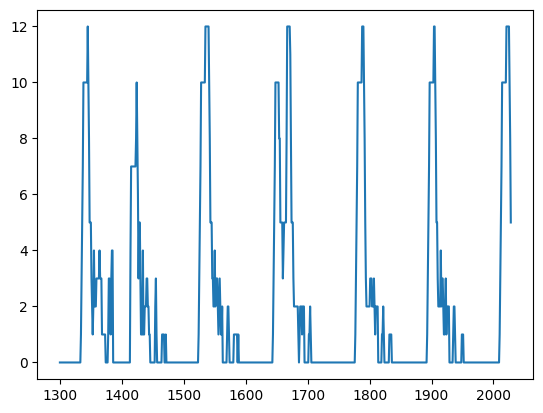

In [36]:
valid_anomaly_score = np.zeros((valid_end_id - valid_start_id, 1))
test_anomaly_score = np.zeros((test_end_id - test_start_id, 1))


valid_data = np.load("valid.npy")
valid_data = valid_data[:, -1, ...]  # only compare the last matrix with the reconstructed data
reconstructed_valid_data = np.load("valid_reconstructed.npy")
print("The shape of valid data is {}".format(valid_data.shape))
print("The shape of reconstructed valid data is {}".format(reconstructed_valid_data.shape))

valid_len = valid_end_id - valid_start_id

for i in range(valid_end_id - valid_start_id):
    '''
    np.subtract - поэлементное вычитание двух массивов
    Выполняется поэлементное вычитание массивов test_data и reconstructed_data
    Для каждой итерации цикла находится массив квадратов разностей между элемментами
    Элементов valid = 200
    Элементов test = 472
    '''

    error = np.square(np.subtract(valid_data[i, ..., 0], reconstructed_valid_data[i, ..., 0]))
    

    '''
    Создается массив индексов.
    Вычисляется количество элементов в полученном кластере индексов.
    '''
    threshold_array = np.full((4, 4), threshold_default)
    num_anom = np.sum(error > threshold_array) #np.where работает странно
    valid_anomaly_score[i] = num_anom

max_valid_anom = np.max(valid_anomaly_score)
threshold = max_valid_anom * alpha

print("Max valid anom is %.2f" % max_valid_anom)
print("Threshold is %.2f" % threshold)
test_data = np.load("test.npy")
print("test_data after loading", test_data.shape)
test_data = test_data[:, -1, ...]  # only compare the last matrix with the reconstructed data
print("test_data", test_data.shape)
reconstructed_test_data = np.load("test_reconstructed.npy")

print('reconstructed_test_data', reconstructed_test_data.shape)
for i in range(test_end_id - test_start_id):
    error = np.square(np.subtract(test_data[i, ..., 0], reconstructed_test_data[i, ..., 0]))
    threshold_array = np.full((4, 4), threshold_default)
    num_anom = np.sum(error > threshold_array)
    test_anomaly_score[i] = num_anom

x_ces = np.arange(1300, 2029)
plt.plot(x_ces, test_anomaly_score)
plt.show()

In [10]:
print(test_data.shape)
print(reconstructed_test_data.shape)

(4310, 4, 4, 3)
(4310, 4, 4, 3)


<AxesSubplot:>

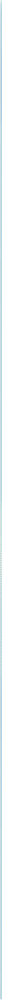

In [13]:
#reconstructed_test_data.shape
#fig, axes = plt.subplots(168, 12, figsize=(10, 150))
fig, axes = plt.subplots(1, 1, figsize=(0.4, 600))

global_min = np.min([np.min(matrix) for matrix in reconstructed_test_data])
global_max = np.max([np.max(matrix) for matrix in reconstructed_test_data])


conc_reconstructed_test_data = np.concatenate(reconstructed_test_data[:431], axis = 0)
conc_conc_reconstructed_test_data = np.concatenate(conc_reconstructed_test_data, axis = 0)
#print(conc_conc_reconstructed_test_data.shape)
sns.heatmap(conc_conc_reconstructed_test_data, cmap="YlGnBu", vmin=global_min, vmax=global_max, annot=False) 


In [16]:
print(global_min, global_max)

-0.4245652 1.3083931


Тепловые карты исходных сигнатурных матриц до MSCRED:

In [24]:
fig, axes = plt.subplots(1, 1, figsize=(50, 600))

#global_min = np.min([np.min(matrix) for matrix in test_data])
#global_max = np.max([np.max(matrix) for matrix in test_data])

global_min = np.min([np.min(matrix) for matrix in reconstructed_test_data])
global_max = np.max([np.max(matrix) for matrix in reconstructed_test_data])

print(test_data.shape)
reshaped_arr = test_data.reshape(10, 431, 4, 4, 3)
concatenated_arr = np.concatenate(reshaped_arr, axis=1)

conc_concatenated_arr = np.concatenate(concatenated_arr, axis=1)
conc_conc_concatenated_arr = np.concatenate(conc_concatenated_arr, axis=1)
#conc_conc_concatenated_arr.shape
sns.heatmap(conc_conc_concatenated_arr, cmap="YlGnBu", vmin=global_min, vmax=global_max, annot=False) 
print(conc_conc_concatenated_arr.shape)

(4310, 4, 4, 3)
(1724, 120)


Тепловые карты восстановленных сигнатурных матриц:

In [25]:
fig, axes = plt.subplots(1, 1, figsize=(50, 600))

#global_min = np.min([np.min(matrix) for matrix in test_data])
#global_max = np.max([np.max(matrix) for matrix in test_data])

global_min = np.min([np.min(matrix) for matrix in reconstructed_test_data])
global_max = np.max([np.max(matrix) for matrix in reconstructed_test_data])

print(reconstructed_test_data.shape)
reshaped_arr = reconstructed_test_data.reshape(10, 431, 4, 4, 3)
concatenated_arr = np.concatenate(reshaped_arr, axis=1)
#print(concatenated_arr.shape)
conc_concatenated_arr = np.concatenate(concatenated_arr, axis=1)
conc_conc_concatenated_arr = np.concatenate(conc_concatenated_arr, axis=1)
#conc_conc_concatenated_arr.shape
sns.heatmap(conc_conc_concatenated_arr, cmap="YlGnBu", vmin=global_min, vmax=global_max, annot=False) 
print(conc_conc_concatenated_arr.shape)

(4310, 4, 4, 3)
(1724, 120)


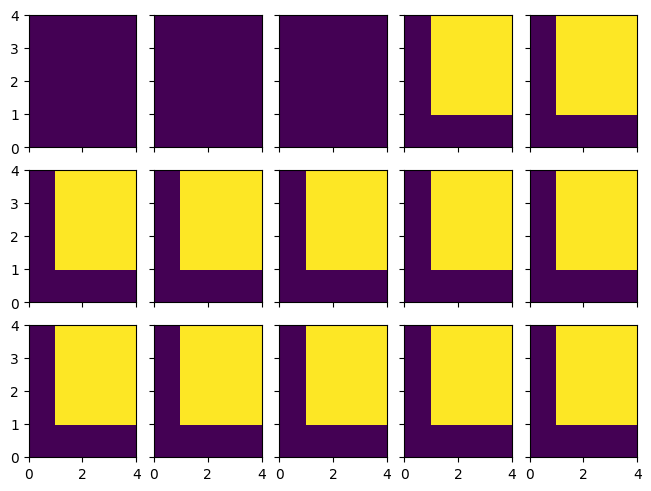

In [22]:
time = 890
test_data_path = "test.npy"
test_data = np.load(test_data_path)
fig, axs = plt.subplots(3, 5, sharex = True, sharey = True, layout = "constrained")
for window in range(0, 3):
    for step in range(0, 5):
        axs[window, step].pcolor(test_data[time, step, :, :, window])

In [23]:
test_data.shape

(4310, 5, 4, 4, 3)

In [25]:
time = 890
test_rec_data_path = "test_reconstructed.npy"
test_rec_data = np.load(test_rec_data_path)
#fig, axs = plt.subplots(3, 5, sharex = True, sharey = True, layout = "constrained")
#for window in range(0, 3):
    #for step in range(0, 5):
        #axs[window, step].pcolor(test_data[time, step, :, :, window])

In [27]:
test_rec_data.shape

(4310, 4, 4, 3)